## 1. Import libraries and data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split

In [2]:
#Create a path to where the data is stored.
path = r'/Users/vicky/OneDrive/文件/careerfoundry/Machine Learning with Python/Datasets'

In [3]:
# Ensures the charts created are displayed in the notebook without the need to "call" them.
%matplotlib inline

In [4]:
#Read in the European weather data.
climate = pd.read_csv(os.path.join(path,'Dataset-weather-prediction-dataset-processed.csv'))
climate

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.0180,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.0180,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.0180,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.0180,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.0180,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,1,2.1,0.79,1.0248,1.34,0.22,0,7.7,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22946,20221028,10,6,2.1,0.77,1.0244,1.34,0.22,0,5.4,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22947,20221029,10,4,2.1,0.76,1.0227,1.34,0.22,0,6.1,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22948,20221030,10,5,2.1,0.80,1.0212,1.34,0.22,0,5.8,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5


In [5]:
#Read in the pleasant weather data.
pleasant = pd.read_csv(os.path.join(path,'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))
pleasant

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## 2. DUSSELDORF Weather Station

In [6]:
# Create subset for DUSSELDORF
df_DUSSELDORF = climate[['DUSSELDORF_cloud_cover',
 'DUSSELDORF_wind_speed',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 'DUSSELDORF_global_radiation',
 'DUSSELDORF_precipitation',
 'DUSSELDORF_snow_depth',
 'DUSSELDORF_sunshine',
 'DUSSELDORF_temp_mean',
 'DUSSELDORF_temp_min',
 'DUSSELDORF_temp_max']].copy()

In [7]:
df_DUSSELDORF.describe()

,DUSSELDORF_cloud_cover,DUSSELDORF_wind_speed,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_snow_depth,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
count,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000
mean,5.241786,3.918022,0.757502,1.016148,1.135907,0.207578,0.170109,4.186519,10.718671,6.626824,14.754052
std,2.237902,1.817540,0.115862,0.008530,0.877636,0.417016,1.295166,4.125114,6.790568,6.162739,7.928710
min,0.000000,0.200000,0.260000,0.964700,0.000000,0.000000,0.000000,0.000000,-14.600000,-20.800000,-10.900000
25%,4.000000,2.500000,0.690000,1.011800,0.370000,0.000000,0.000000,0.300000,5.700000,2.300000,8.700000
50%,6.000000,3.600000,0.770000,1.016100,0.910000,0.010000,0.000000,3.100000,10.900000,6.900000,14.800000
75%,7.000000,5.000000,0.840000,1.021100,1.770000,0.240000,0.000000,7.100000,15.900000,11.400000,20.700000
max,8.000000,29.500000,1.000000,1.047300,4.190000,5.740000,27.000000,16.000000,31.200000,24.900000,40.700000


In [8]:
df_DUSSELDORF.shape

(22950, 11)

In [67]:
df_DUSSELDORF.to_csv(os.path.join(path,'climate__DUSSELDORF_nodate_cleaned.csv'))

In [9]:
pleasant_DUSSELDORF = pleasant[['DUSSELDORF_pleasant_weather']].copy()

In [10]:
pleasant_DUSSELDORF['DUSSELDORF_pleasant_weather'].value_counts(dropna = False)

DUSSELDORF_pleasant_weather
0    18016
1     4934
Name: count, dtype: int64

In [11]:
pleasant_DUSSELDORF.shape

(22950, 1)

In [68]:
pleasant_DUSSELDORF.to_csv(os.path.join(path,'pleasant__DUSSELDORF.csv'))

In [12]:
X = df_DUSSELDORF
y = pleasant_DUSSELDORF
print(X.shape)
print(y.shape)

(22950, 11)
(22950, 1)


In [13]:
# List of weather veriables
weather = ['cloud_cover',
 'wind_speed',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'snow_depth',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [14]:
#Create Label
labels = {0: 'Not Pleasant', 1: 'Pleasant'}

In [15]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [16]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 11) (18360, 1)
(4590, 11) (4590, 1)


In [17]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\vicky\anaconda3\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [18]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.9997821350762527


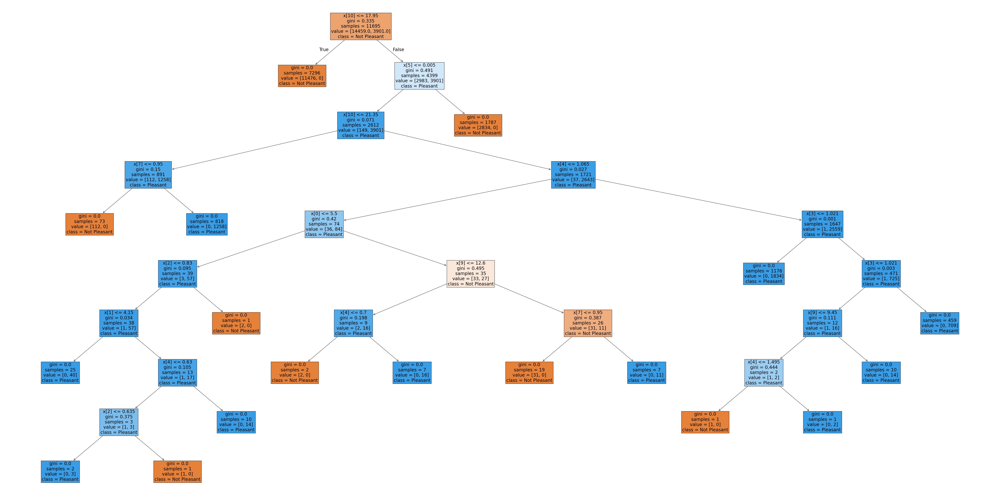

In [19]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[12], fontsize = 20, class_names=labels, filled=True);#, feature_names = X.columns,class_names=['Disease', "No Disease"],filled=True); max_depth = 4, 

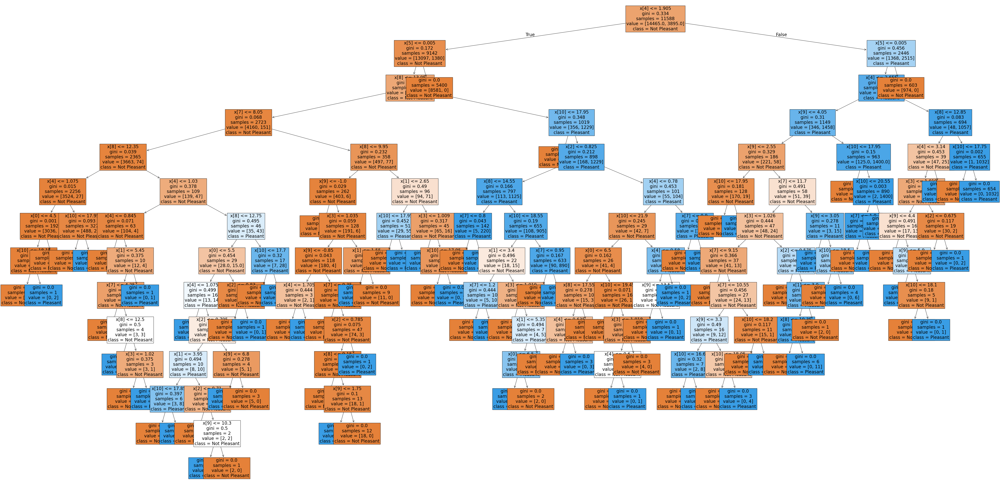

In [20]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[90], fontsize = 20, class_names=labels, filled=True);#, feature_names = X.columns,class_names=['Disease', "No Disease"],filled=True); max_depth = 4, 

In [21]:
# Conduct feature importances analysis
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.04095191, 0.00722752, 0.01825117, 0.0151472 , 0.09958036,
       0.32891891, 0.        , 0.09558486, 0.15169627, 0.02767093,
       0.21497086])

In [22]:
np.set_printoptions(threshold=1000)

In [23]:
newarray = newarray.reshape(-1,1,11)
print(newarray.shape)
newarray

(1, 1, 11)


array([[[0.04095191, 0.00722752, 0.01825117, 0.0151472 , 0.09958036,
         0.32891891, 0.        , 0.09558486, 0.15169627, 0.02767093,
         0.21497086]]])

In [24]:
sumarray = np.sum(newarray[0], axis=0)
sumarray

array([0.04095191, 0.00722752, 0.01825117, 0.0151472 , 0.09958036,
       0.32891891, 0.        , 0.09558486, 0.15169627, 0.02767093,
       0.21497086])

In [25]:
important = pd.Series(sumarray, index = weather) #.sort_values(ascending = False)
important

cloud_cover         0.040952
wind_speed          0.007228
humidity            0.018251
pressure            0.015147
global_radiation    0.099580
precipitation       0.328919
snow_depth          0.000000
sunshine            0.095585
temp_mean           0.151696
temp_min            0.027671
temp_max            0.214971
dtype: float64

['cloud_cover', 'wind_speed', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'snow_depth', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


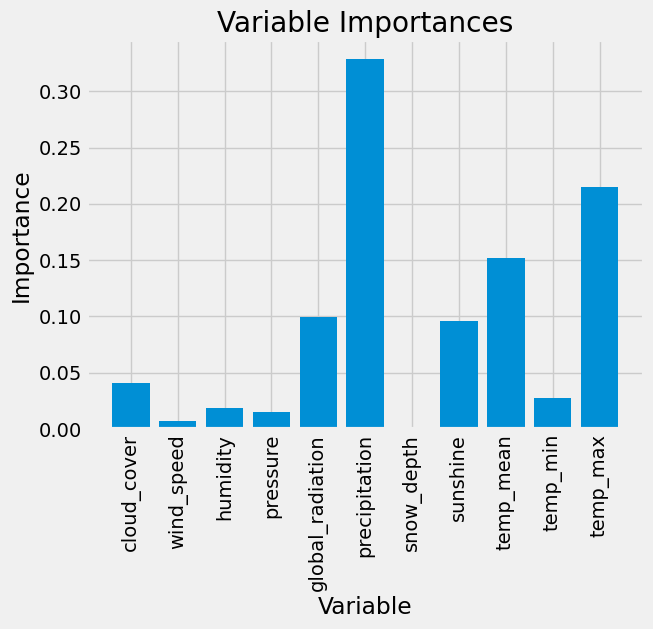

In [26]:
# Conduct variable importances by most influential weather station (broad analysis)
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(weather)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, weather, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

## 3. MUNCHENB Weather Station

In [27]:
# Create subset for MUNCHENB
df_MUNCHENB = climate[['MUNCHENB_cloud_cover',
 'MUNCHENB_humidity',
 'MUNCHENB_global_radiation',
 'MUNCHENB_precipitation',
 'MUNCHENB_snow_depth',
 'MUNCHENB_sunshine',
 'MUNCHENB_temp_mean',
 'MUNCHENB_temp_min',
 'MUNCHENB_temp_max']].copy()

In [28]:
df_MUNCHENB.describe()

,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_snow_depth,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max
count,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000
mean,5.227451,0.762837,1.374096,0.262379,1.208192,4.906118,9.014540,4.751996,13.613843
std,2.424283,0.124359,0.943718,0.573925,3.942367,4.468089,7.957285,7.221321,9.160389
min,0.000000,0.200000,0.170000,0.000000,0.000000,0.000000,-22.500000,-27.600000,-17.800000
25%,4.000000,0.680000,0.560000,0.000000,0.000000,0.400000,2.900000,-0.300000,6.500000
50%,6.000000,0.780000,1.180000,0.010000,0.000000,4.000000,9.400000,5.000000,14.100000
75%,7.000000,0.860000,2.090000,0.270000,0.000000,8.500000,15.300000,10.500000,20.800000
max,8.000000,1.000000,3.730000,9.790000,50.000000,15.700000,29.500000,22.000000,37.000000


In [29]:
df_MUNCHENB

,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_snow_depth,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max
0,5,0.67,0.20,0.10,0,0.0,6.9,1.1,10.4
1,6,0.72,0.61,0.30,0,5.1,6.2,4.2,10.2
2,6,0.91,0.20,0.30,0,0.0,5.8,4.0,8.0
3,6,0.90,0.20,0.01,0,0.0,3.9,3.2,5.4
4,5,0.85,0.65,0.96,0,5.6,1.8,-3.0,6.0
...,...,...,...,...,...,...,...,...,...
22945,2,0.76,1.37,0.26,0,9.7,14.3,8.3,22.2
22946,6,0.70,1.37,0.26,0,7.7,16.1,8.9,26.1
22947,7,0.64,1.37,0.26,0,6.8,17.4,11.2,26.2
22948,6,0.75,1.37,0.26,0,8.3,14.5,9.2,23.5


In [30]:
pleasant_MUNCHENB = pleasant[['MUNCHENB_pleasant_weather']].copy()

In [31]:
pleasant_MUNCHENB['MUNCHENB_pleasant_weather'].value_counts(dropna = False)

MUNCHENB_pleasant_weather
0    18183
1     4767
Name: count, dtype: int64

In [32]:
pleasant_MUNCHENB.shape

(22950, 1)

In [33]:
X = df_MUNCHENB
y = pleasant_MUNCHENB
print(X.shape)
print(y.shape)

(22950, 9)
(22950, 1)


In [34]:
# List of MUNCHENB weather Station veriables
weather = ['cloud_cover',
 'humidity',
 'global_radiation',
 'precipitation',
 'snow_depth',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [35]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [36]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 9) (18360, 1)
(4590, 9) (4590, 1)


In [37]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\vicky\anaconda3\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [38]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


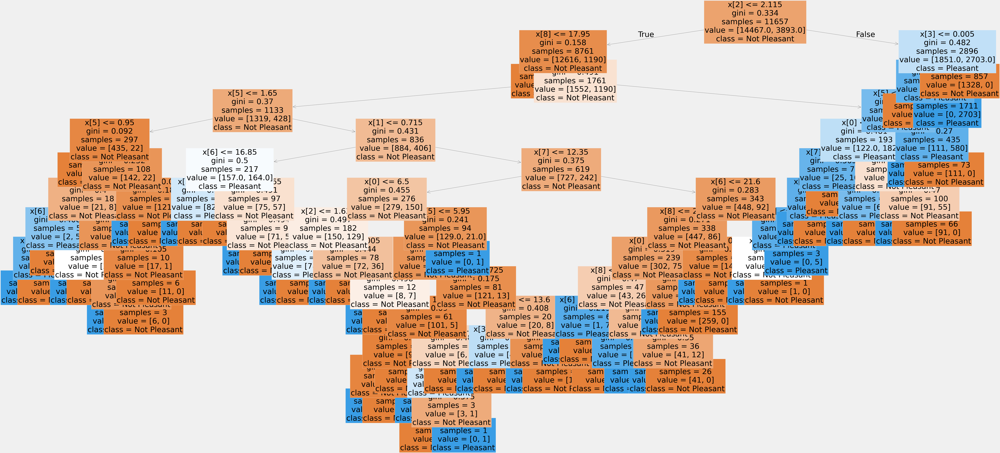

In [39]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[12], fontsize = 40, class_names=labels, filled=True);#, feature_names = X.columns,class_names=['Disease', "No Disease"],filled=True); max_depth = 4, 

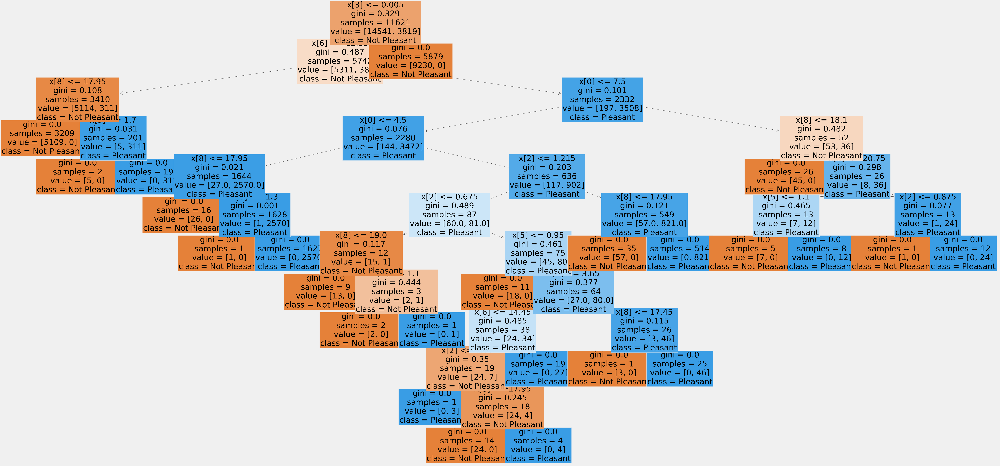

In [40]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[88], fontsize = 40, class_names=labels, filled=True);#, feature_names = X.columns,class_names=['Disease', "No Disease"],filled=True); max_depth = 4, 

In [41]:
# Conduct feature importances analysis
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([4.01145990e-02, 7.59160186e-03, 3.82374448e-02, 3.84132353e-01,
       2.63652554e-04, 1.10566274e-01, 1.23801656e-01, 9.00504357e-03,
       2.86287375e-01])

In [42]:
np.set_printoptions(threshold=1000)

In [43]:
newarray = newarray.reshape(-1,1,9)
print(newarray.shape)
newarray

(1, 1, 9)


array([[[4.01145990e-02, 7.59160186e-03, 3.82374448e-02, 3.84132353e-01,
         2.63652554e-04, 1.10566274e-01, 1.23801656e-01, 9.00504357e-03,
         2.86287375e-01]]])

In [44]:
sumarray = np.sum(newarray[0], axis=0)
sumarray

array([4.01145990e-02, 7.59160186e-03, 3.82374448e-02, 3.84132353e-01,
       2.63652554e-04, 1.10566274e-01, 1.23801656e-01, 9.00504357e-03,
       2.86287375e-01])

In [45]:
important = pd.Series(sumarray, index = weather) #.sort_values(ascending = False)
important

cloud_cover         0.040115
humidity            0.007592
global_radiation    0.038237
precipitation       0.384132
snow_depth          0.000264
sunshine            0.110566
temp_mean           0.123802
temp_min            0.009005
temp_max            0.286287
dtype: float64

['cloud_cover', 'humidity', 'global_radiation', 'precipitation', 'snow_depth', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


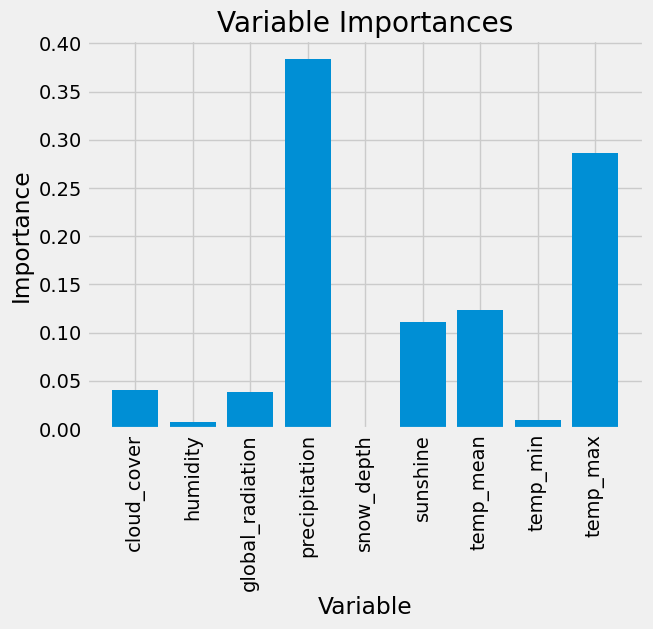

In [46]:
# Conduct variable importances by most influential weather station (broad analysis)
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(weather)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, weather, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

## 4. BASEL Weather Station

In [47]:
# Create subset for BASEL
df_BASEL = climate[['BASEL_cloud_cover',
 'BASEL_wind_speed',
 'BASEL_humidity',
 'BASEL_pressure',
 'BASEL_global_radiation',
 'BASEL_precipitation',
 'BASEL_snow_depth',
 'BASEL_sunshine',
 'BASEL_temp_mean',
 'BASEL_temp_min',
 'BASEL_temp_max']].copy()

In [48]:
df_BASEL.describe()

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
count,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000,22950.000000
mean,5.410763,2.120462,0.758554,1.018013,1.345244,0.222305,0.359564,4.592222,10.392471,6.317015,15.076322
std,2.406115,0.732625,0.110699,0.006543,0.931158,0.498995,2.006231,4.310808,7.363575,6.524121,8.730759
min,0.000000,0.000000,0.350000,0.974700,0.010000,0.000000,-2.000000,0.000000,-18.500000,-23.300000,-14.000000
25%,4.000000,2.100000,0.680000,1.015800,0.540000,0.000000,0.000000,0.400000,4.700000,1.400000,8.300000
50%,6.000000,2.100000,0.770000,1.018000,1.130000,0.000000,0.000000,3.600000,10.700000,6.500000,15.400000
75%,7.000000,2.100000,0.840000,1.020100,2.070000,0.220000,0.000000,7.900000,16.200000,11.500000,21.900000
max,8.000000,16.300000,1.000000,1.045200,4.560000,8.500000,49.000000,16.800000,29.200000,22.400000,38.600000


In [49]:
df_BASEL.shape

(22950, 11)

In [50]:
pleasant_BASEL = pleasant[['BASEL_pleasant_weather']].copy()

In [51]:
pleasant_BASEL['BASEL_pleasant_weather'].value_counts(dropna = False)

BASEL_pleasant_weather
0    17286
1     5664
Name: count, dtype: int64

In [52]:
pleasant_BASEL.shape

(22950, 1)

In [53]:
X = df_BASEL
y = pleasant_BASEL
print(X.shape)
print(y.shape)

(22950, 11)
(22950, 1)


In [54]:
# List of weather veriables
weather = ['cloud_cover',
 'wind_speed',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'snow_depth',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [55]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [56]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(18360, 11) (18360, 1)
(4590, 11) (4590, 1)


In [57]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

C:\Users\vicky\anaconda3\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [58]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


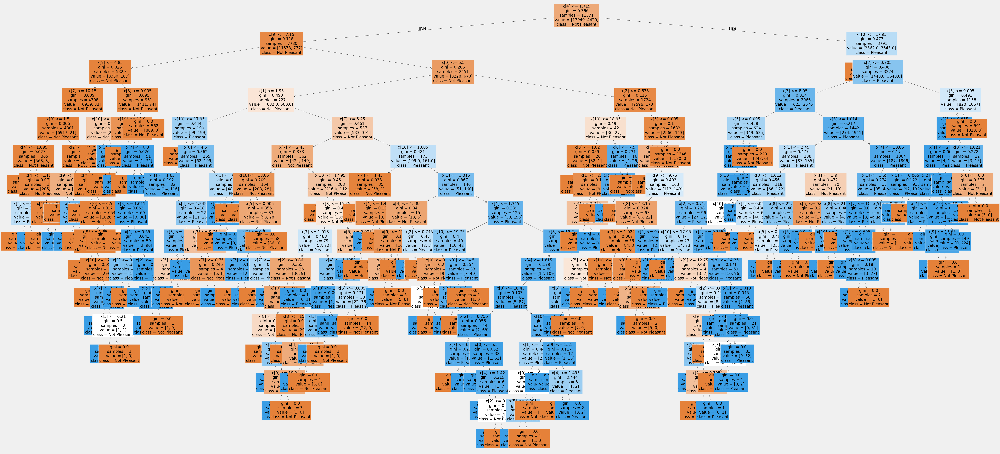

In [59]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[4], fontsize = 20, class_names=labels, filled=True);#, feature_names = X.columns,class_names=['Disease', "No Disease"],filled=True); max_depth = 4, 

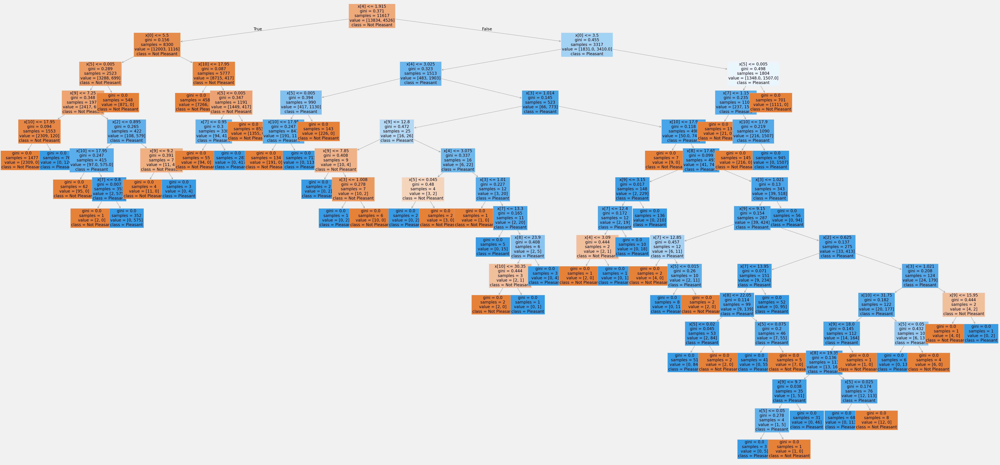

In [60]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[65], fontsize = 20, class_names=labels, filled=True);#, feature_names = X.columns,class_names=['Disease', "No Disease"],filled=True); max_depth = 4, 

In [61]:
# Conduct feature importances analysis
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([2.83838939e-02, 1.85101130e-03, 1.47637552e-02, 9.55162309e-03,
       1.08341085e-01, 3.36937214e-01, 3.55135687e-05, 1.10148880e-01,
       8.93037625e-02, 2.95200021e-02, 2.71163259e-01])

In [62]:
np.set_printoptions(threshold=1000)

In [63]:
newarray = newarray.reshape(-1,1,11)
print(newarray.shape)
newarray

(1, 1, 11)


array([[[2.83838939e-02, 1.85101130e-03, 1.47637552e-02, 9.55162309e-03,
         1.08341085e-01, 3.36937214e-01, 3.55135687e-05, 1.10148880e-01,
         8.93037625e-02, 2.95200021e-02, 2.71163259e-01]]])

In [64]:
sumarray = np.sum(newarray[0], axis=0)
sumarray

array([2.83838939e-02, 1.85101130e-03, 1.47637552e-02, 9.55162309e-03,
       1.08341085e-01, 3.36937214e-01, 3.55135687e-05, 1.10148880e-01,
       8.93037625e-02, 2.95200021e-02, 2.71163259e-01])

In [65]:
important = pd.Series(sumarray, index = weather) #.sort_values(ascending = False)
important

cloud_cover         0.028384
wind_speed          0.001851
humidity            0.014764
pressure            0.009552
global_radiation    0.108341
precipitation       0.336937
snow_depth          0.000036
sunshine            0.110149
temp_mean           0.089304
temp_min            0.029520
temp_max            0.271163
dtype: float64

['cloud_cover', 'wind_speed', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'snow_depth', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


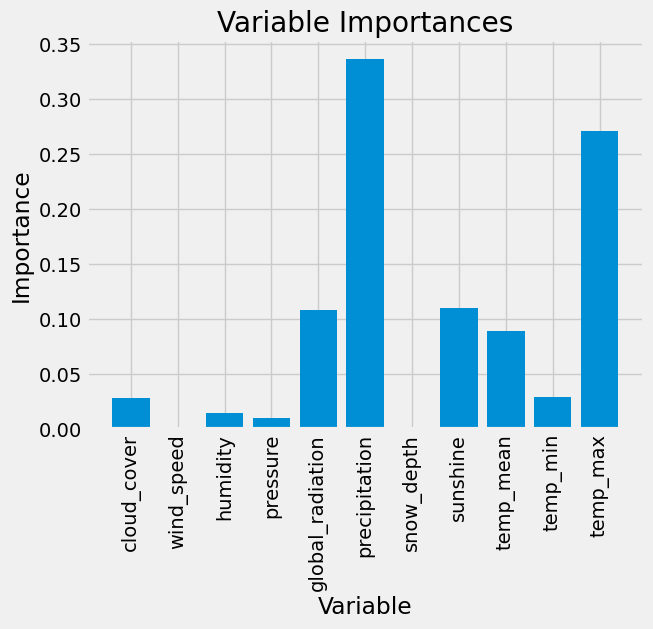

In [66]:
# Conduct variable importances by most influential weather station (broad analysis)
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(weather)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, weather, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');